# CV703: Week 7 Lab 
# Object Detection with MMDetection

In this tutorial, you will learn:
- the basic structure of a single stage detector.
- to perform inference with a MMDetection detector.
- to train a new detector with a new dataset.


## Install MMDetection

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

/bin/bash: line 1: nvcc: command not found
gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [1]:
# install dependencies: 
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0"

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 38019, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 38019 (delta 39), reused 61 (delta 25), pack-reused 37917
Receiving objects: 100% (38019/38019), 63.24 MiB | 18.33 MiB/s, done.
Resolving deltas: 100% (26205/26205), done.
Updating files: 100% (2443/2443), done.
/home/ufaq.khan/Courses/AI702/Model_1/mmdetection
Obtaining file:///home/ufaq.khan/Courses/AI702/Model_1/mmdetection
  Preparing metadata (setup.py) ... done
  Using cached pycocotools-2.0.7-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.1 kB)
  Using cached scipy-1.10.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (58 kB)
Using cached pycocotools-2.0.7-cp38-cp38-manylinux_2_17_x86_64.

Additional libraries

In [1]:
!pip install future tensorboard
!pip install setuptools==59.5.0

  Using cached tensorboard-2.14.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached google_auth_oauthlib-1.0.0-py2.py3-none-any.whl.metadata (2.7 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-manylinux_2_31_x86_64.whl.metadata (1.1 kB)
  Using cached MarkupSafe-2.1.5-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.0 kB)
  Using cached oauthlib-3.2.2-py3-none-any.whl.metadata (7.5 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.3/491.3 kB 1.8 MB/s eta 0:00:000:00:010:00:01:01m
Using cached tensorboard-2.14.0-py3-none-any.whl (5.5 MB)
Using cached absl_py-2.1.0-py3-none-any.whl (133 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.2/189.2 kB 10.2 MB/s eta 0:00:00
Using cached google_auth_oauthlib-1.0.0-py2.py3-none-any.whl (18 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 17.1 MB/s eta 0:00:00m eta 0:00:010:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 3

In [6]:
!mim install mmcv==2.1

/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
  Using cached https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/mmcv-2.1.0-cp38-cp38-manylinux1_x86_64.whl (77.6 MB)
  Attempting uninstall: mmcv
    Found existing installation: mmcv 2.2.0
    Uninstalling mmcv-2.2.0:
      Successfully uninstalled mmcv-2.2.0
/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other st

In [1]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

/home/umairnawaz/.conda/envs/mmdetection/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


sys.platform: linux
Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
CUDA available: True
MUSA available: False
numpy_random_seed: 2147483648
GPU 0,1,2,3: NVIDIA RTX A5000
CUDA_HOME: None
GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
PyTorch: 1.9.0+cu111
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-gencode;arch=compute_86,code=sm_86
  - CuDNN 8.0.5
  - Magma 2.5.2
  - Build settings: BLAS_INFO=

## Perform Inference with An MMDet detector



### An efficient Real-Time one-stage detector

In this tutorial, we use RTMDet, an efficient Real-Time one-stage detector as an example.

The high-level architecture of RTMDet is shown in the following picture. More details can be found in the [paper](https://arxiv.org/abs/2212.07784).

![RTMDet](https://user-images.githubusercontent.com/27466624/225922103-404064c1-3cb0-4ab5-9388-79f9517dcdb0.jpg)

To obtain a more efficient model architecture, MMDetection explore an architecture that has compatible capacities in the backbone and neck, constructed by a basic building block that consists of large-kernel depth-wise convolutions. MMDetection further introduce soft labels when calculating matching costs in the dynamic label assignment to improve accuracy. Together with better training techniques, the resulting object detector, named RTMDet, achieves 52.8% AP on COCO with 300+ FPS on an NVIDIA 3090 GPU, outperforming the current mainstream industrial detectors. RTMDet achieves the best parameter-accuracy trade-off with tiny/small/medium/large/extra-large model sizes for various application scenarios, and obtains new state-of-the-art performance on real-time instance segmentation and rotated object detection. We hope the experimental results can provide new insights into designing versatile real-time object detectors for many object recognition tasks.



In [2]:
# We download the pre-trained checkpoints for inference and finetuning.

import os
os.chdir(r"./mmdetection/")

!mkdir ./checkpoints_detr
# !mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest ./checkpoints
# !mim download mmdet --config ssdlite_mobilenetv2-scratch_8xb24-600e_coco --dest ./checkpoints

!mim download mmdet --config deformable-detr_r50_16xb2-50e_coco --dest ./checkpoints_detr

processing deformable-detr_r50_16xb2-50e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.7/231.7 MiB 3.5 MB/s eta 0:00:0000:0100:03
Successfully downloaded deformable-detr_r50_16xb2-50e_coco_20221029_210934-6bc7d21b.pth to /share/sdb/umairnawaz/AI702/Project/mmdetection/checkpoints_detr
Successfully dumped deformable-detr_r50_16xb2-50e_coco.py to /share/sdb/umairnawaz/AI702/Project/mmdetection/checkpoints_detr


### Inference the detector

Since the model is successfully created and loaded, let's see how good it is. We use the high-level API `DetInferencer` implemented in the MMDetection. This API is created to ease the inference process. The details of the codes can be found [here](https://github.com/open-mmlab/mmdetection/blob/dev-3.x/mmdet/apis/det_inferencer.py).

In [4]:
from mmdet.apis import DetInferencer

# Choose to use a config
model_name = 'deformable-detr_r50_16xb2-50e_coco'
# Setup a checkpoint file to load
checkpoint = './checkpoints_detr/deformable-detr_r50_16xb2-50e_coco_20221029_210934-6bc7d21b.pth'

# Set the device to be used for evaluation
device = 'cuda:1'

# Initialize the DetInferencer
inferencer = DetInferencer(model_name, checkpoint, device)



Loads checkpoint by local backend from path: ./checkpoints_detr/deformable-detr_r50_16xb2-50e_coco_20221029_210934-6bc7d21b.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

04/27 21:42:08 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.


/home/umairnawaz/.conda/envs/mmdetection/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


In [5]:

# Use the detector to do inference
img = './data/test/M0101_000001.jpg'
result = inferencer(img, out_dir='./output')



/home/umairnawaz/.conda/envs/mmdetection/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/umairnawaz/.conda/envs/mmdetection/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named
tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for
anything important until they are released as stable. (Triggered internally at  
/pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)

/home/umairnawaz/.conda/envs/mmdetection/lib/python3.8/site-packages/torch/_tensor.py:575: UserWarning: 
floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like 
the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use 
torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)

In [7]:
# Show the structure of result dict
from rich.pretty import pprint
pprint(result, max_length=4)

{
│   'predictions': [
│   │   {
│   │   │   'labels': [2, 2, 2, 2, ... +82],
│   │   │   'scores': [0.9464824795722961, 0.9350112080574036, 0.9281225204467773, 0.9276778101921082, ... +82],
│   │   │   'bboxes': [
│   │   │   │   [525.6348266601562, 294.4894714355469, 559.4513549804688, 325.791259765625],
│   │   │   │   [668.3578491210938, 492.3632507324219, 714.4143676757812, 537.9448852539062],
│   │   │   │   [866.9909057617188, 380.18463134765625, 906.705078125, 403.5748291015625],
│   │   │   │   [961.2314453125, 487.7783203125, 1010.9183959960938, 520.1197509765625],
│   │   │   │   ... +82
│   │   │   ],
│   │   │   'masks': [
│   │   │   │   {
│   │   │   │   │   'size': [540, 1024],
│   │   │   │   │   'counts': '_Vf84g`04K3N2O2N1O1O1O2N2N1O1O2N2N1000O100O2N1O1O1O2N1O1O2M2O1O2M3Mm]e7'
│   │   │   │   },
│   │   │   │   {
│   │   │   │   │   'size': [540, 1024],
│   │   │   │   │   'counts': 'oXQ;4f`04M2N2N3N1O1N3N1O2N2N1O1O1O101N1O2O1O1O001O00O11OO101N1O2N1O1O1O2N1O1O1O2N1O2N1O2N1N3Lg_S5'
│   │   │   │   },
│   │   │   │   {
│   │   │   │   │   'size': [540, 1024],
│   │   │   │   │   'counts': 'lbY>3g`04M2N2O1N2O1N2O0O10000O1000O10O10O100000O10O1000O010000O10001O00001O1O1N2N3MUkm1'
│   │   │   │   },
│   │   │   │   {
│   │   │   │   │   'size': [540, 1024],
│   │   │   │   │   'counts': '_ik?5f`03M3N1N2N2O1N2O1O1N101N100O100O100O10O010O10O100O100O01O1000O01O1O100N3O0O2O1N101N3M2M4L]_8'
│   │   │   │   },
│   │   │   │   ... +82
│   │   │   ]
│   │   }
│   ],
│   'visualization': [
│   │   array([[[203, 208, 204],
│   │   [203, 208, 204],
│   │   [203, 208, 204],
│   │   ...,
│   │   [200, 205, 211],
│   │   [192, 197, 203],
│   │   [195, 198, 203]],
│      
│      [[202, 207, 203],
│   │   [203, 208, 204],
│   │   [204, 209, 205],
│   │   ...,
│   │   [199, 204, 210],
│   │   [193, 198, 204],
│   │   [190, 193, 198]],
│      
│      [[203, 208, 204],
│   │   [204, 209, 205],
│   │   [205, 210, 206],
│   │   ...,
│   │   [192, 197, 203],
│   │   [195, 200, 206],
│   │   [183, 186, 191]],
│      
│      ...,
│      
│      [[169, 149, 150],
│   │   [170, 150, 151],
│   │   [172, 152, 153],
│   │   ...,
│   │   [103,  97, 187],
│   │   [188, 185, 225],
│   │   [211, 209, 236]],
│      
│      [[166, 146, 145],
│   │   [169, 149, 148],
│   │   [172, 152, 153],
│   │   ...,
│   │   [212, 210, 237],
│   │   [212, 210, 237],
│   │   [210, 209, 236]],
│      
│      [[164, 144, 143],
│   │   [166, 146, 145],
│   │   [166, 146, 147],
│   │   ...,
│   │   [205, 204, 233],
│   │   [205, 204, 233],
│   │   [205, 204, 233]]], dtype=uint8)
│   ]
}

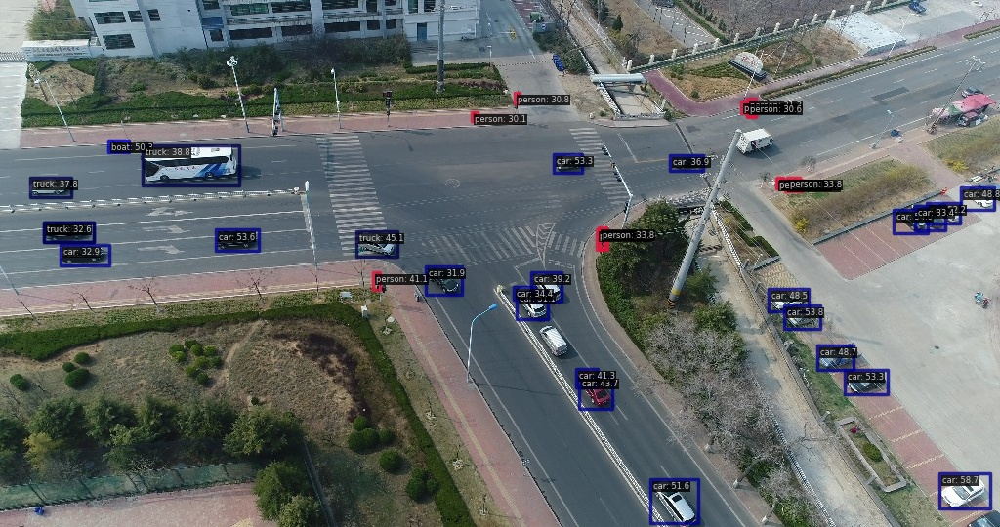

In [6]:
# Show the output image
from PIL import Image
Image.open('./output/vis/M0101_000001.jpg')

## Train with customized datasets

In this part, you will know how to train predefined models with customized datasets and then test it. We use the [balloon dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon) as an example to describe the whole process.

The basic steps are as below:

1. Prepare the customized dataset
2. Prepare a config
3. Train, test, and infer models on the customized dataset.


### Prepare the customized dataset

There are three ways to support a new dataset in MMDetection:

1. Reorganize the dataset into COCO format.
2. Reorganize the dataset into a middle format.
3. Implement a new dataset.

Usually, we recommend using the first two methods which are usually easier than the third.

In this tutorial, we use the ballon dataset an example of converting the data into COCO format.

**Note**: Datasets and metrics have been decoupled except CityScapes since MMDetection 3.0. Therefore, users can use any kind of evaluation metrics for any format of datasets during validation. For example: evaluate on COCO dataset with VOC metric, or evaluate on OpenImages dataset with both VOC and COCO metrics.

In [7]:
# Download the data and unzip it
!python tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

python: can't open file 'tools/misc/download_dataset.py': [Errno 2] No such file or directory


In [12]:
import os.path as osp
import mmcv
from mmengine.fileio import dump, load
from mmengine.utils import track_iter_progress

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    data_infos = list(data_infos.values())
    for idx, v in enumerate(track_iter_progress(data_infos)):
        filename = v['filename']
        img_path = osp.join(image_prefix, filename)
        height, width = mmcv.imread(img_path).shape[:2]

        images.append(
            dict(id=idx, file_name=filename, height=height, width=width))
        
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            obj = obj['shape_attributes']
            px = obj['all_points_x']
            py = obj['all_points_y']
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{
            'id': 0,
            'name': 'balloon'
        }])
    dump(coco_format_json, out_file)

if __name__ == '__main__':
    convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
                            out_file='data/balloon/train.json',
                            image_prefix='data/balloon/train')
    convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
                            out_file='data/balloon/val.json',
                            image_prefix='data/balloon/val')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 38.3 task/s, elapsed: 2s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 34.1 task/s, elapsed: 0s, ETA:     0s


## Prepare a config

The second step is to prepare a config thus the dataset could be successfully loaded. Assume that we want to use RTMDet-tiny, the config to train the detector on balloon dataset is as below. Assume the config is under directory `configs/rtmdet/` and named as `rtmdet_tiny_1xb4-20e_balloon.py`, the config is as below.


In [10]:
config_balloon_swin = """
_base_ = [
    '../_base_/datasets/coco_detection.py', '../_base_/default_runtime.py'
]

data_root = './data/' # dataset root

#values changed
train_batch_size_per_gpu = 2
train_num_workers = 2


#values changed
max_epochs = 10 
stage2_num_epochs = 1
base_lr = 0.0025


metainfo = {
    'classes': ('car', ),
    'palette': [
        (220, 20, 60),
    ]
}

model = dict(
    type='DeformableDETR',
    num_queries=300,
    num_feature_levels=4,
    with_box_refine=False,
    as_two_stage=False,
    data_preprocessor=dict(
        type='DetDataPreprocessor',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        bgr_to_rgb=True,
        pad_size_divisor=1),
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet50')),
    neck=dict(
        type='ChannelMapper',
        in_channels=[512, 1024, 2048],
        kernel_size=1,
        out_channels=256,
        act_cfg=None,
        norm_cfg=dict(type='GN', num_groups=32),
        num_outs=4),
    encoder=dict(  # DeformableDetrTransformerEncoder
        num_layers=6,
        layer_cfg=dict(  # DeformableDetrTransformerEncoderLayer
            self_attn_cfg=dict(  # MultiScaleDeformableAttention
                embed_dims=256,
                batch_first=True),
            ffn_cfg=dict(
                embed_dims=256, feedforward_channels=1024, ffn_drop=0.1))),
    decoder=dict(  # DeformableDetrTransformerDecoder
        num_layers=6,
        return_intermediate=True,
        layer_cfg=dict(  # DeformableDetrTransformerDecoderLayer
            self_attn_cfg=dict(  # MultiheadAttention
                embed_dims=256,
                num_heads=8,
                dropout=0.1,
                batch_first=True),
            cross_attn_cfg=dict(  # MultiScaleDeformableAttention
                embed_dims=256,
                batch_first=True),
            ffn_cfg=dict(
                embed_dims=256, feedforward_channels=1024, ffn_drop=0.1)),
        post_norm_cfg=None),
    positional_encoding=dict(num_feats=128, normalize=True, offset=-0.5),
    bbox_head=dict(
        type='DeformableDETRHead',
        num_classes=1,
        sync_cls_avg_factor=True,
        loss_cls=dict(
            type='FocalLoss',
            use_sigmoid=True,
            gamma=2.0,
            alpha=0.25,
            loss_weight=2.0),
        loss_bbox=dict(type='L1Loss', loss_weight=5.0),
        loss_iou=dict(type='GIoULoss', loss_weight=2.0)),
    # training and testing settings
    train_cfg=dict(
        assigner=dict(
            type='HungarianAssigner',
            match_costs=[
                dict(type='FocalLossCost', weight=2.0),
                dict(type='BBoxL1Cost', weight=5.0, box_format='xywh'),
                dict(type='IoUCost', iou_mode='giou', weight=2.0)
            ])),
    test_cfg=dict(max_per_img=100))

# train_pipeline, NOTE the img_scale and the Pad's size_divisor is different
# from the default setting in mmdet.
train_pipeline = [
    dict(type='LoadImageFromFile', backend_args={{_base_.backend_args}}),
    dict(type='LoadAnnotations', with_bbox=True , with_mask=False),
    dict(type='RandomFlip', prob=0.5),
    dict(
        type='RandomChoice',
        transforms=[
            [
                dict(
                    type='RandomChoiceResize',
                    scales=[(480, 1333), (512, 1333), (544, 1333), (576, 1333),
                            (608, 1333), (640, 1333), (672, 1333), (704, 1333),
                            (736, 1333), (768, 1333), (800, 1333)],
                    keep_ratio=True)
            ],
            [
                dict(
                    type='RandomChoiceResize',
                    # The radio of all image in train dataset < 7
                    # follow the original implement
                    scales=[(400, 4200), (500, 4200), (600, 4200)],
                    keep_ratio=True),
                dict(
                    type='RandomCrop',
                    crop_type='absolute_range',
                    crop_size=(384, 600),
                    allow_negative_crop=True),
                dict(
                    type='RandomChoiceResize',
                    scales=[(480, 1333), (512, 1333), (544, 1333), (576, 1333),
                            (608, 1333), (640, 1333), (672, 1333), (704, 1333),
                            (736, 1333), (768, 1333), (800, 1333)],
                    keep_ratio=True)
            ]
        ]),
    dict(type='PackDetInputs')
]
train_dataloader = dict(
    batch_size=3,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        filter_cfg=dict(filter_empty_gt=False), pipeline=train_pipeline,
        data_prefix=dict(img='train/'),
        ann_file='train_coco_new.json'))

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val_coco_new.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val_coco_new.json',
                    metric=['bbox'])

test_evaluator = val_evaluator

# optimizer
optim_wrapper = dict(
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=0.0002, weight_decay=0.0001),
    clip_grad=dict(max_norm=0.1, norm_type=2),
    paramwise_cfg=dict(
        custom_keys={
            'backbone': dict(lr_mult=0.1),
            'sampling_offsets': dict(lr_mult=0.1),
            'reference_points': dict(lr_mult=0.1)
        }))

# learning policy
max_epochs = 10
train_cfg = dict(
    type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

param_scheduler = [
    dict(
        type='MultiStepLR',
        begin=0,
        end=max_epochs,
        by_epoch=True,
        milestones=[40],
        gamma=0.1)
]

# NOTE: `auto_scale_lr` is for automatically scaling LR,
# USER SHOULD NOT CHANGE ITS VALUES.
# base_batch_size = (16 GPUs) x (2 samples per GPU)
auto_scale_lr = dict(base_batch_size=2)

gpu_ids = range(1, 2)
"""

with open('./configs/deformable_detr/deformable-detr_r50_16xb2-50e_coco.py', 'w') as f:
    f.write(config_balloon_swin)

In [3]:
# !pip install "numpy<1.24"
# !cd mmdetection/
# !pwd
import os
os.chdir(r"./mmdetection/")
# !pwd

# import json
# from pprint import pprint
# def convert_bbox_to_polygon(bbox):
#     x = bbox[0]
#     y = bbox[1]
#     w = bbox[2]
#     h = bbox[3]
#     polygon = [x,y,(x+w),y,(x+w),(y+h),x,(y+h)]
#     return([polygon])
# def main():
#     file_path = "../data/test_coco.json"
#     f = open(file_path)
#     data = json.load(f)
#     for line in data["annotations"]:
#         segmentation = convert_bbox_to_polygon(line["bbox"])
#         line["segmentation"] = segmentation
#     with open("../data/test_coco_new.json", 'w') as f:
#         f.write(json.dumps(data))
#     print('DONE')
# main()


In [34]:
!pwd

/share/sdb/umairnawaz/AI702/Project/mmdetection


In [11]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
# os.environ["CUDA_VISIBLE_DEVICES"]="1"
!python tools/train.py configs/deformable_detr/deformable-detr_r50_16xb2-50e_coco.py

04/28 17:25:02 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1988217034
    GPU 0,1,2,3: NVIDIA RTX A5000
    CUDA_HOME: None
    GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
    PyTorch: 1.9.0+cu111
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch



We can also check the tensorboard to see the curves.

In [30]:
# load tensorboard in notebook
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./work_dirs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 249656), started 9:10:04 ago. (Use '!kill 249656' to kill it.)

From the tensorboard, we can observe that changes of loss and learning rate. We can see the losses of each branch gradually decrease as the training goes by.

## Test the Trained Detector

After finetuning the detector, let's visualize the prediction results!

In [53]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import numpy as np
import json

# Assuming `results` is your list of inference results where each item is:
# {'image_id': image_id, 'category_id': prediction_label, 'bbox': [x, y, width, height], 'score': confidence}

class NumpyEncoder(json.JSONEncoder):
    """ Custom encoder for numpy data types """
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()  # Convert ndarray to list
        if isinstance(obj, np.integer):
            return int(obj)  # Convert numpy ints to Python ints
        if isinstance(obj, np.floating):
            return float(obj)  # Convert numpy floats to Python floats
        return json.JSONEncoder.default(self, obj)
    
# Serialize using the custom encoder
inferred_results = 'inferred_results.json'
with open(inferred_results, 'w') as file:
    json.dump(results, file, cls=NumpyEncoder)

# Load your COCO formatted ground truth
coco_gt = COCO('./data/car/test_coco.json')  # Update path as needed
coco_dt = coco_gt.loadRes(inferred_results)  # Load your results

# Create COCO Eval object
coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

# mAP can be accessed from coco_eval.stats
mAP = coco_eval.stats[0]  # Index for mAP at IoU=0.50:0.95
print(f"Mean Average Precision (mAP): {mAP}")


In [ ]:
from mmdet.apis import DetInferencer
import glob
import os

# Choose to use a config
config = 'configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Directory containing images to process
image_dir = './data/car/test/'
images = glob.glob(os.path.join(image_dir, '*.jpg'))

# Process each image
results = []
for img in images:
    # Use the detector to do inference
    result = inferencer(img, out_dir='./output')
    results.append(result)
    # print(f"Processed {img}")

# Here `results` holds all inference results, which you can use for further processing or evaluation.


In [37]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)



# Use the detector to do inference
img = './data/car/test/M0101_000001.jpg'
result = inferencer(img, out_dir='./output')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco_bbox_mAP_epoch_10.pth


/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


In [34]:

# Use the detector to do inference
img = './data/car/test/M0101_000001.jpg'
result = inferencer(img, out_dir='./output')

/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named 
tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for
anything important until they are released as stable. (Triggered internally at  
/pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)

/home/ufaq.khan/.conda/envs/mmdSSD/lib/python3.8/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is 
deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' 
function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use 
torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)

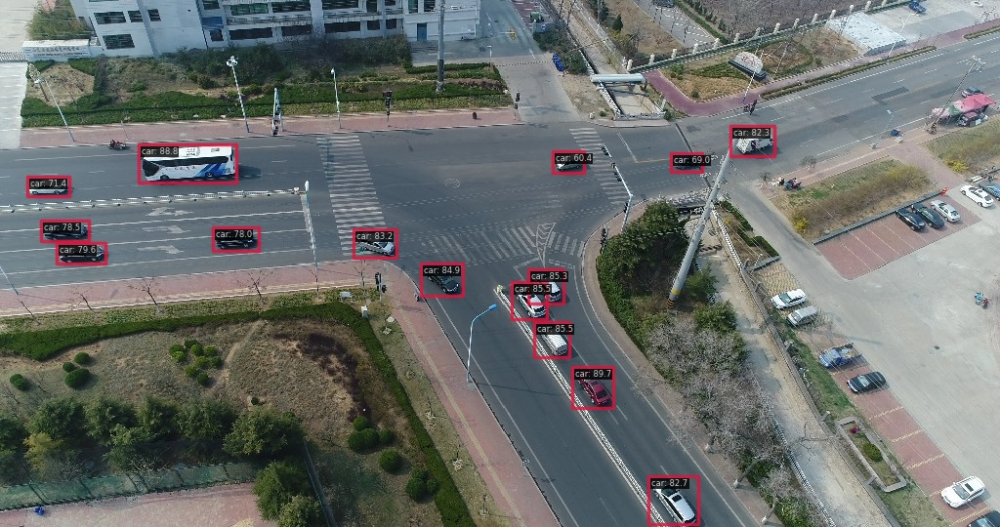

In [39]:
from PIL import Image

# Show the output image
Image.open('./output/vis/M0101_000001.jpg')

## Task 2

Try a two-stage detector from the [model zoo](https://mmdetection.readthedocs.io/en/3.x/model_zoo.html).

- Compare average precision (AP).
- Compare training and testing speed.


In [8]:
# We download the pre-trained checkpoints for inference and finetuning.
# !mkdir ./checkpoints
!mim download mmdet --config faster-rcnn_r50-caffe-dc5_1x_coco --dest ./checkpoints

processing faster-rcnn_r50-caffe-dc5_1x_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.1/632.1 MiB 3.0 MB/s eta 0:00:00m eta 0:00:010:00:10
Successfully downloaded faster_rcnn_r50_caffe_dc5_1x_coco_20201030_151909-531f0f43.pth to /home/hosam.elgendy/Downloads/mmdetection/mmdetection/checkpoints
Successfully dumped faster-rcnn_r50-caffe-dc5_1x_coco.py to /home/hosam.elgendy/Downloads/mmdetection/mmdetection/checkpoints


In [15]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './faster-rcnn_r50-caffe-dc5_1x_coco.py'

data_root = 'data/balloon/' # dataset root

auto_scale_lr = dict(base_batch_size=16, enable=False)
backend_args = None


#Must lower the batch size

train_batch_size_per_gpu = 2
train_num_workers = 2

max_epochs = 30
stage2_num_epochs = 1
base_lr = 0.0025


metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}


default_hooks = dict(
    checkpoint=dict(interval=1, type='CheckpointHook'),
    logger=dict(interval=50, type='LoggerHook'),
    param_scheduler=dict(type='ParamSchedulerHook'),
    sampler_seed=dict(type='DistSamplerSeedHook'),
    timer=dict(type='IterTimerHook'),
    visualization=dict(type='DetVisualizationHook'))
default_scope = 'mmdet'
env_cfg = dict(
    cudnn_benchmark=False,
    dist_cfg=dict(backend='nccl'),
    mp_cfg=dict(mp_start_method='fork', opencv_num_threads=0))
load_from = None
log_level = 'INFO'
log_processor = dict(by_epoch=True, type='LogProcessor', window_size=50)
model = dict(
    backbone=dict(
        depth=50,
        dilations=(
            1,
            1,
            1,
            2,
        ),
        frozen_stages=1,
        init_cfg=dict(
            checkpoint='open-mmlab://detectron2/resnet50_caffe',
            type='Pretrained'),
        norm_cfg=dict(requires_grad=False, type='BN'),
        norm_eval=True,
        num_stages=4,
        out_indices=(3, ),
        strides=(
            1,
            2,
            2,
            1,
        ),
        style='caffe',
        type='ResNet'),
    data_preprocessor=dict(
        bgr_to_rgb=False,
        mean=[
            103.53,
            116.28,
            123.675,
        ],
        pad_size_divisor=32,
        std=[
            1.0,
            1.0,
            1.0,
        ],
        type='DetDataPreprocessor'),
    roi_head=dict(
        bbox_head=dict(
            bbox_coder=dict(
                target_means=[
                    0.0,
                    0.0,
                    0.0,
                    0.0,
                ],
                target_stds=[
                    0.1,
                    0.1,
                    0.2,
                    0.2,
                ],
                type='DeltaXYWHBBoxCoder'),
            fc_out_channels=1024,
            in_channels=2048,
            loss_bbox=dict(loss_weight=1.0, type='L1Loss'),
            loss_cls=dict(
                loss_weight=1.0, type='CrossEntropyLoss', use_sigmoid=False),
            num_classes=1,
            reg_class_agnostic=False,
            roi_feat_size=7,
            type='Shared2FCBBoxHead'),
        bbox_roi_extractor=dict(
            featmap_strides=[
                16,
            ],
            out_channels=2048,
            roi_layer=dict(output_size=7, sampling_ratio=0, type='RoIAlign'),
            type='SingleRoIExtractor'),
        type='StandardRoIHead'),
    rpn_head=dict(
        anchor_generator=dict(
            ratios=[
                0.5,
                1.0,
                2.0,
            ],
            scales=[
                2,
                4,
                8,
                16,
                32,
            ],
            strides=[
                16,
            ],
            type='AnchorGenerator'),
        bbox_coder=dict(
            target_means=[
                0.0,
                0.0,
                0.0,
                0.0,
            ],
            target_stds=[
                1.0,
                1.0,
                1.0,
                1.0,
            ],
            type='DeltaXYWHBBoxCoder'),
        feat_channels=2048,
        in_channels=2048,
        loss_bbox=dict(loss_weight=1.0, type='L1Loss'),
        loss_cls=dict(
            loss_weight=1.0, type='CrossEntropyLoss', use_sigmoid=True),
        type='RPNHead'),
    test_cfg=dict(
        rcnn=dict(
            max_per_img=100,
            nms=dict(iou_threshold=0.5, type='nms'),
            score_thr=0.05),
        rpn=dict(
            max_per_img=1000,
            min_bbox_size=0,
            nms=dict(iou_threshold=0.7, type='nms'),
            nms_pre=6000)),
    train_cfg=dict(
        rcnn=dict(
            assigner=dict(
                ignore_iof_thr=-1,
                match_low_quality=False,
                min_pos_iou=0.5,
                neg_iou_thr=0.5,
                pos_iou_thr=0.5,
                type='MaxIoUAssigner'),
            debug=False,
            pos_weight=-1,
            sampler=dict(
                add_gt_as_proposals=True,
                neg_pos_ub=-1,
                num=512,
                pos_fraction=0.25,
                type='RandomSampler')),
        rpn=dict(
            allowed_border=0,
            assigner=dict(
                ignore_iof_thr=-1,
                match_low_quality=True,
                min_pos_iou=0.3,
                neg_iou_thr=0.3,
                pos_iou_thr=0.7,
                type='MaxIoUAssigner'),
            debug=False,
            pos_weight=-1,
            sampler=dict(
                add_gt_as_proposals=False,
                neg_pos_ub=-1,
                num=256,
                pos_fraction=0.5,
                type='RandomSampler')),
        rpn_proposal=dict(
            max_per_img=2000,
            min_bbox_size=0,
            nms=dict(iou_threshold=0.7, type='nms'),
            nms_pre=12000)),
    type='FasterRCNN')
norm_cfg = dict(requires_grad=False, type='BN')
optim_wrapper = dict(
    optimizer=dict(lr=0.02, momentum=0.9, type='SGD', weight_decay=0.0001),
    type='OptimWrapper')
param_scheduler = [
    dict(
        begin=0, by_epoch=False, end=500, start_factor=0.001, type='LinearLR'),
    dict(
        begin=0,
        by_epoch=True,
        end=12,
        gamma=0.1,
        milestones=[
            8,
            11,
        ],
        type='MultiStepLR'),
]
resume = False
test_cfg = dict(type='TestLoop')


train_cfg = dict(max_epochs=12, type='EpochBasedTrainLoop', val_interval=1)

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))


train_pipeline = [
    dict(backend_args=None, type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(keep_ratio=True, scale=(
        1333,
        800,
    ), type='Resize'),
    dict(prob=0.5, type='RandomFlip'),
    dict(type='PackDetInputs'),
]

val_cfg = dict(type='ValLoop')


val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))


vis_backends = [
    dict(type='LocalVisBackend'),
]
visualizer = dict(
    name='visualizer',
    type='DetLocalVisualizer',
    vis_backends=[
        dict(type='LocalVisBackend'),
    ])

    
test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator
    

# load COCO pre-trained weight
load_from = './checkpoints/faster_rcnn_r50_caffe_dc5_1x_coco_20201030_151909-531f0f43.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('./configs/faster_rcnn/faster-rcnn_r50-caffe-dc5_1x_balloon.py', 'w') as f:
    f.write(config_balloon)

In [16]:
!python tools/train.py configs/faster_rcnn/faster-rcnn_r50-caffe-dc5_1x_balloon.py

02/21 14:18:14 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.18 (default, Sep 11 2023, 13:40:15) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1900311746
    GPU 0: Quadro RTX 6000
    CUDA_HOME: None
    GCC: gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 1.9.0+cu111
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.1
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=comp

In [ ]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'mmdetection/mmdetection/configs/faster_rcnn/faster-rcnn_r50-caffe-dc5_1x_balloon.py'
# Setup a checkpoint file to load

checkpoints = glob.glob('./mmdetection/mmdetection/work_dirs/faster-rcnn_r50-caffe-dc5_1x_balloon/epoch_*.pth')
checkpoints.sort(key=lambda x: int(x.split('_')[-1][:-4]))

checkpoint=checkpoints[-1] #choosing the last checkpoint (may not be the best checkpoint)

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)



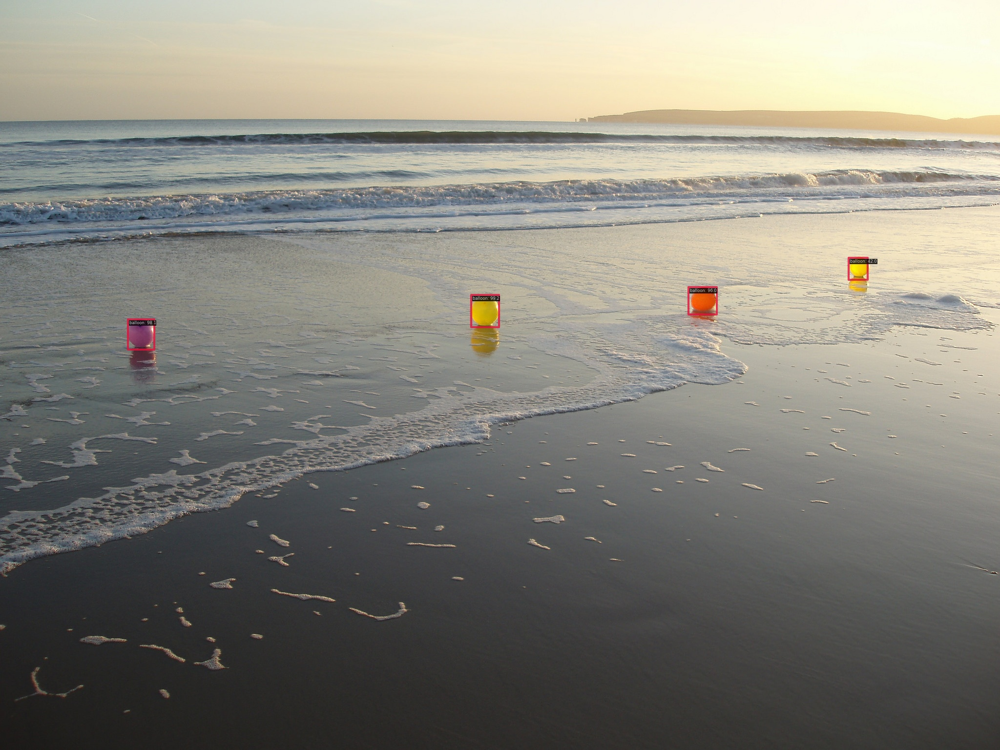

In [8]:
from PIL import Image

# Use the detector to do inference
img = 'balloon/val/6810773040_3d81036d05_k.jpg'
result = inferencer(img, out_dir='./output')

# Show the output image
Image.open('./output/vis/6810773040_3d81036d05_k.jpg')